In [1]:
# Importing 
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import os
import islets
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
import islets._manuscript_functions as mf
import statsmodels.api as sm

In [2]:
pathToFile = "/data/JanK/WD2019_20/glucose_7_pooling.csv"
print (open(pathToFile).read())

glucose,legs,path,diet
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Eva_Viljem_9.3.2020/2021_03_09_EPLi3.lif_analysis/Series003-4/2022_01_17_6.7_rois.pkl,WD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jasmina_11.7.2019/Experiment.lif_analysis/Series016/2022_01_17_12.14_rois.pkl,CD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jasmina_13.5.2020/Experiment__7glu.lif_analysis/Series006-11/2021_12_23_7.8_rois.pkl,WD_SP_NAD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jasmina_19.2.2020/Experiment__2.lif_analysis/Series005-10/2021_12_23_9.10_rois.pkl,CD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jasmina_23.7.2019/Exp_WD_5-1_inv.lif_analysis/Series022/2022_01_19_12.14_rois.pkl,WD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jasmina_24.7.2019/Exp_WD_5-2_p.lif_analysis/Series016-17/2022_01_19_13.15_rois.pkl,WD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jasmina_4.3.2020/Experiment__7 glu.lif_analysis/Series009-14/2022_01_14_11.13_rois.pkl,WD_NAD
7,"{'1':(600,2500)}",/data/JanK/WD2019_20/Jure_13.2.2020/Experiment

In [3]:
data = pd.read_csv(pathToFile)
data['legs'] = data['legs'].apply(eval)
# data = data[::10]
data

,glucose,legs,path,diet
0,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Eva_Viljem_9.3.2020/2021_...,WD
1,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jasmina_11.7.2019/Experim...,CD
2,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jasmina_13.5.2020/Experim...,WD_SP_NAD
3,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jasmina_19.2.2020/Experim...,CD
4,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jasmina_23.7.2019/Exp_WD_...,WD
5,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jasmina_24.7.2019/Exp_WD_...,WD
6,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jasmina_4.3.2020/Experime...,WD_NAD
7,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jure_13.2.2020/Experiment...,WD_SP
8,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jure_13.3.2020/Experiment...,WD
9,7,"{'1': (600, 2500)}",/data/JanK/WD2019_20/Jure_3.3.2020/Experiment_...,WD_NAD


In [4]:
# variableof interest
voi = "diet"

In [5]:
data = data.sort_values([voi])

In [6]:
data[voi].unique()

array(['CD', 'WD', 'WD_NAD', 'WD_NK', 'WD_SP', 'WD_SP_NAD'], dtype=object)

In [7]:
# Here you specify the order in which they appear
varList = ['CD', 'WD', 'WD_NAD', 'WD_NK', 'WD_SP', 'WD_SP_NAD']

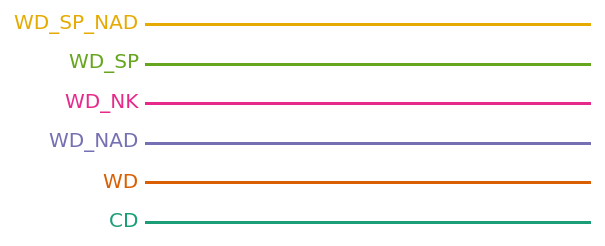

In [8]:
varColorCode = dict(zip(varList, plt.cm.Dark2.colors))
# lets also plot them to see if python understands what we wrote and if we like them
_, ax = plt.subplots(1,1,figsize = (4,len(varColorCode)/3))
for il,var in enumerate(varColorCode):
    ax.axhline(il,color=varColorCode[var])
    ax.text(0,il,var+" ", va="center", ha="right", color=varColorCode[var])
mf.mystyle_axes(ax)

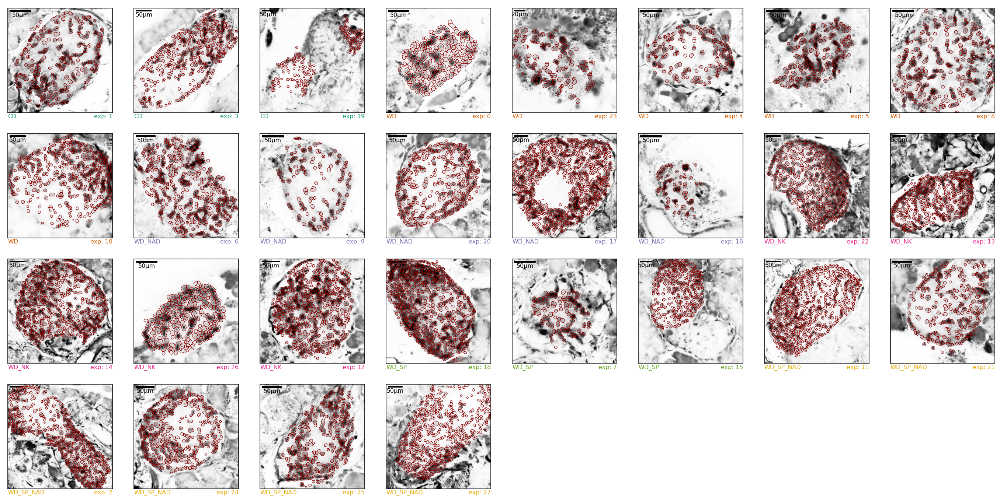

In [9]:
nc = 8
nr = int(np.ceil(len(data)/nc))
fig, axs = plt.subplots(nr,nc,figsize=(3*nc,3*nr))
ia = 0
for i in data.index:
    path = data.loc[i,"path"]
    ## here we load the regions if we didn't ye
    if "regions" in data.columns and isinstance(data.loc[i,"regions"], islets.Regions):
        regions = data.loc[i,"regions"]
    else:
        regions = islets.load_regions(path)
        data.loc[i,"regions"] = [regions]
    ## here we plot the regions
    ax = axs.flat[ia]
    regions.plotEdges(ax=ax, scaleFontSize=8)
    ia += 1
    ax.set_xticks([])
    ax.set_yticks([])
    var = data.loc[i,voi]
    ax.text(0,-.01,f"{var}",size=8,va="top",transform=ax.transAxes, color=varColorCode[var])
    ax.text(1,-.01,f"exp: {i}",size=8,va="top",transform=ax.transAxes, color=varColorCode[var],ha="right")
    
# remove unused axes
for ax in axs.flat[ia:]:
    ax.remove()

/home/srdjan/github/Physio_Ca/islets/_manuscript_functions.py:615: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (figwidth, figheight))


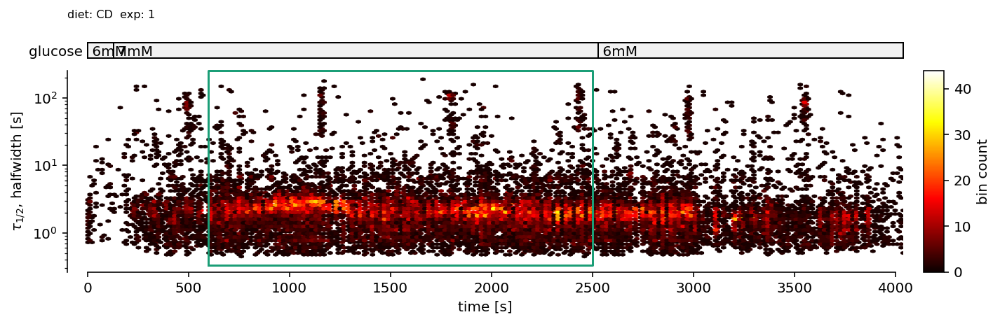

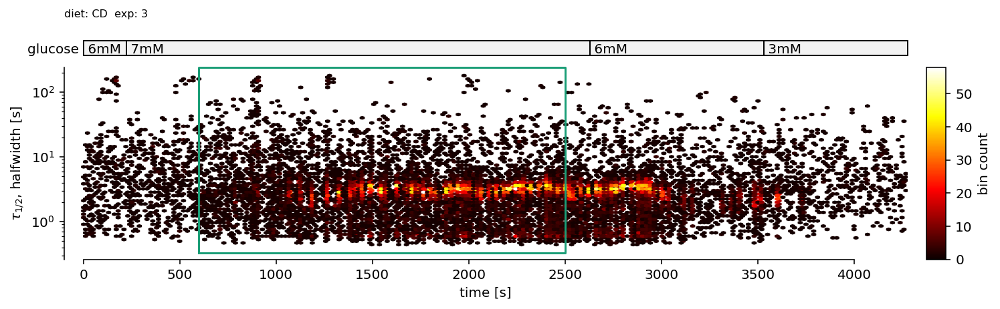

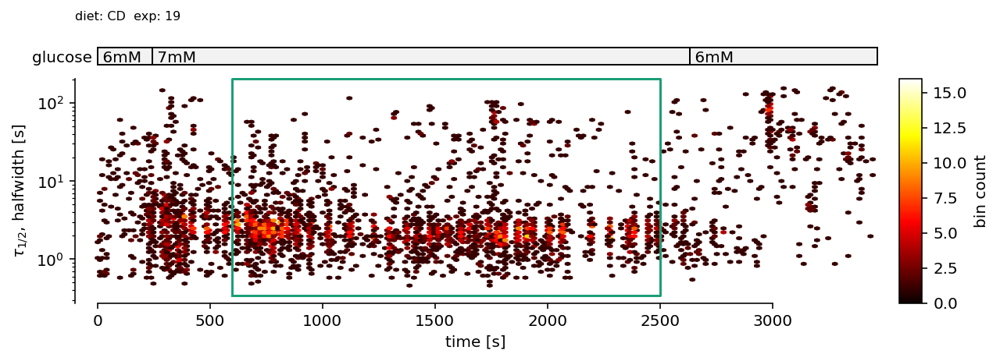

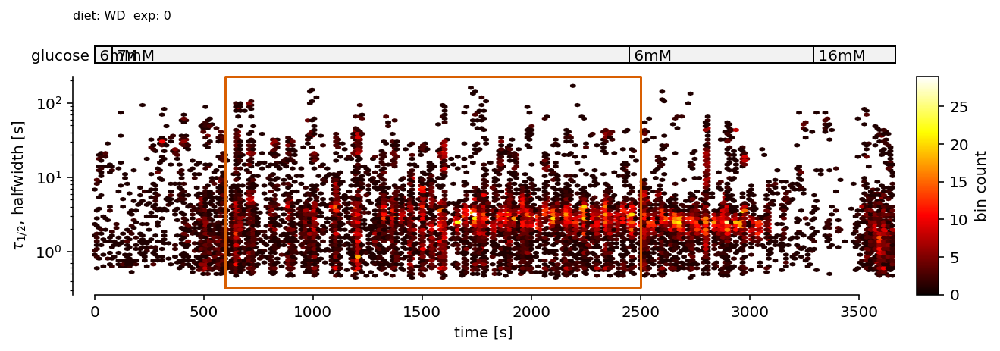

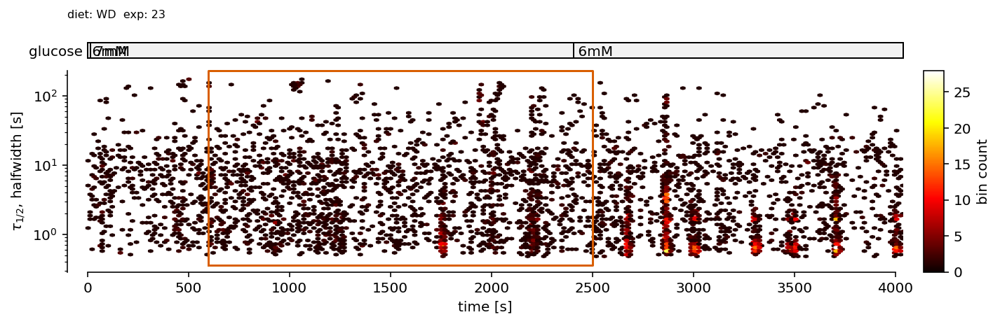

...

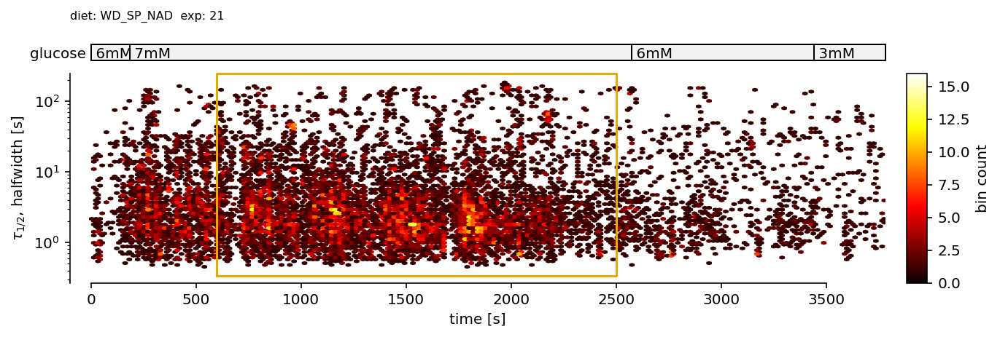

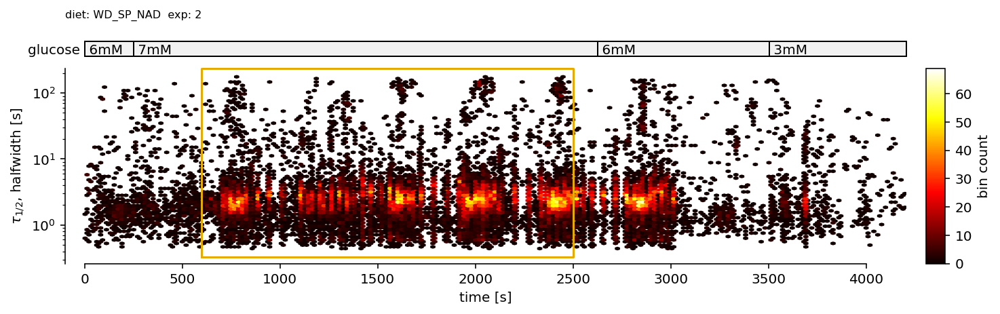

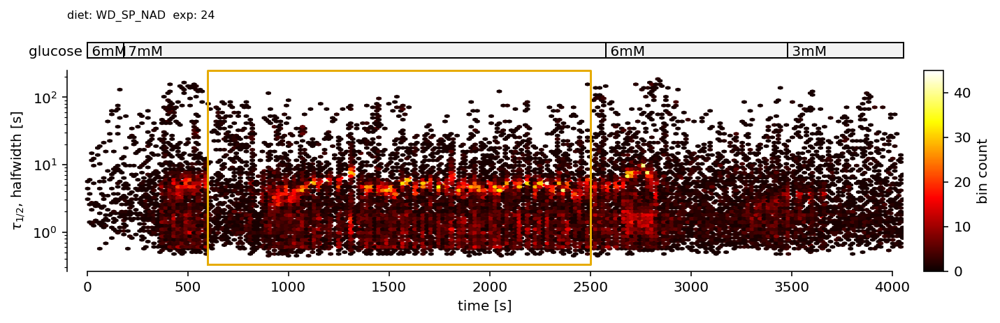

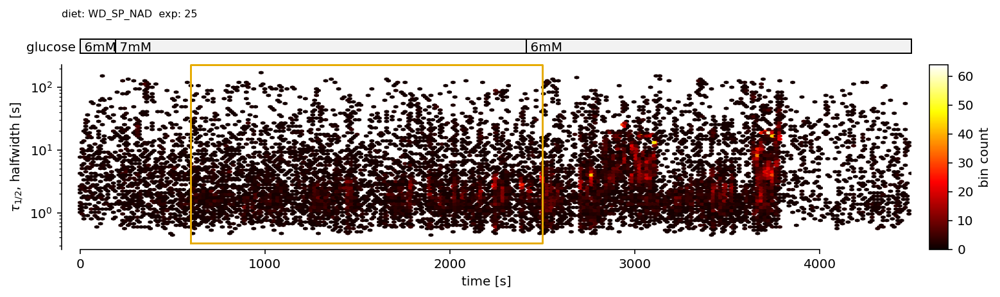

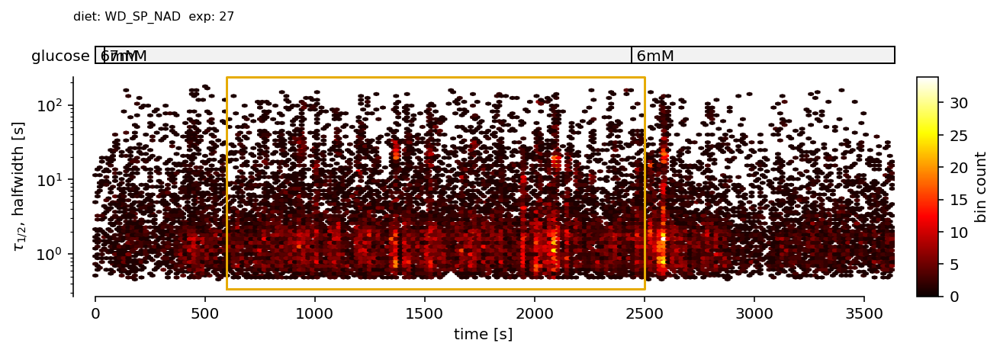

In [10]:
for i in data.index:
    # construct events_path from the roi path
    path = data.loc[i,"path"]
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    # regions are in our table now
    regions = data.loc[i,"regions"]
    # reading events each time from the file is very fast
    Events = pd.read_csv(events_path, index_col=0)
    # plot events
    fig, axs = mf.plot_events(Events, regions)
    ax = axs[0]
    var = data.loc[i,voi]
    legs = data.loc[i,"legs"]
    ax.text(0,1.3,f"{voi}: {var}  exp: {i}",size=8,va="top",transform=ax.transAxes)
    for leg in legs:
        mf.emphasize_region(ax,legs[leg],ax.get_ylim(), color=varColorCode[var])
    ax.set_ylim(ax.get_ylim()[0]*.8,None)

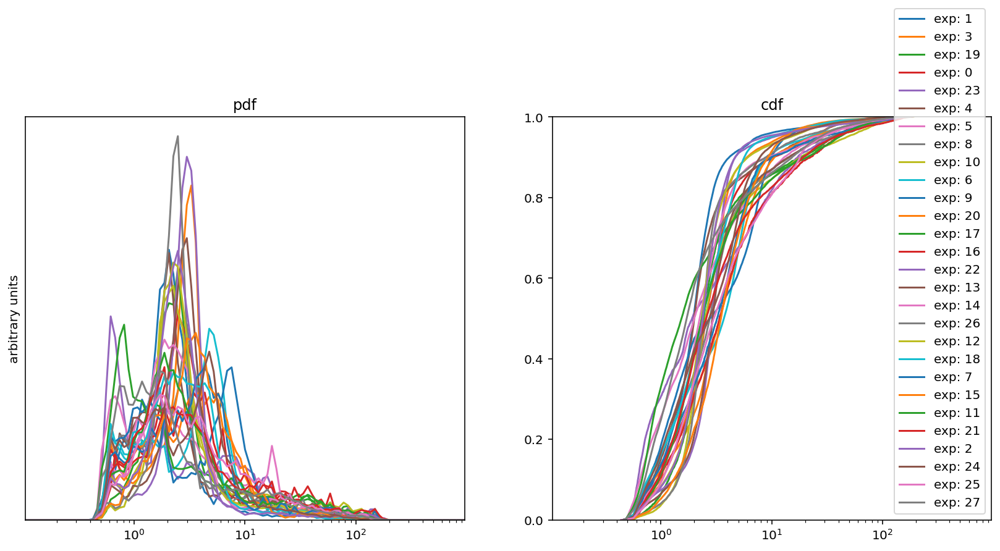

In [11]:
hwBinEdges = np.geomspace(start = .1, stop = 1000, num = 100)
hwBinCenters = np.sqrt( hwBinEdges[1:] * hwBinEdges[:-1])
fig, axs = plt.subplots(1,2,figsize=(14,6))
axs[0].set_title("pdf")
axs[1].set_title("cdf")
for ax in axs:
    ax.set_xscale("log")
for i in data.index:
    # construct events_path from the roi path
    path = data.loc[i,"path"] 
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    # reading events each time from the file is very fast
    Events = pd.read_csv(events_path, index_col=0)
    x = Events["halfwidth"].values.copy()
    h = np.histogram(x, hwBinEdges)[0]
    h = h/h.sum()
    axs[0].plot(hwBinCenters, h, label=f"exp: {i}")
    x.sort()
    axs[1].plot(x, np.linspace(0,1,len(x)), label=f"exp: {i}")
axs[0].set_ylim(0,)
axs[0].set_yticks([])
axs[0].set_ylabel("arbitrary units")
axs[1].set_ylim(0,1)
for ax in axs:
    ax.set_xlim(hwBinCenters[[0,-1]])
axs[1].legend(loc=4)

In [12]:
hwRegions = {
#    "ultrashort": (0.2,1.5),
    "short": (0.5,20),
#    "long":  (30,200),
}

In [13]:
# we again iterate over rows of data, this time collecting the important objects for each experiment:
allEpmpr = []
minEvents = 10
# ... 
for i in data.index:
    # ... import events, ...
    path = data.loc[i,"path"] 
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    Events = pd.read_csv(events_path, index_col=0)
    # define legs
    islets.EventDistillery.define_legs(Events, data.loc[i,"legs"])
    # ... calculate events per min per active roi, ...
    evpmpar = mf.get_events_per_min_per_nrois(  # <-- see Step3 for an explanation what this does
        Events,
        hwRegions,
        minEvents=minEvents,
        reduceRois=2,
        Nbootstrap=30
    )
    # ... we label result with the experiment index
    expLabel = "exp"+str(i)
    evpmpar["experiment"] = expLabel
    evpmpar[voi] = data.loc[i,voi]
    ## and collect it into the big list
    allEpmpr += [evpmpar]

There are 211 rois with more than 10 events (79%).
Out of them, 105 are sampled 30 times to estimate mean and std of the firing rate.
There are 316 rois with more than 10 events (84%).
Out of them, 158 are sampled 30 times to estimate mean and std of the firing rate.
There are 112 rois with more than 10 events (62%).
Out of them, 56 are sampled 30 times to estimate mean and std of the firing rate.
There are 142 rois with more than 10 events (78%).
Out of them, 71 are sampled 30 times to estimate mean and std of the firing rate.
There are 116 rois with more than 10 events (74%).
Out of them, 58 are sampled 30 times to estimate mean and std of the firing rate.
There are 104 rois with more than 10 events (68%).
Out of them, 52 are sampled 30 times to estimate mean and std of the firing rate.
There are 134 rois with more than 10 events (71%).
Out of them, 67 are sampled 30 times to estimate mean and std of the firing rate.
There are 197 rois with more than 10 events (74%).
Out of them, 98 

In [14]:
allEpmpr = pd.concat(allEpmpr,ignore_index=True)

In [15]:
allEpmpr.sort_values(["experiment","hw_region"])

,hw_region,leg,epmpr,epmpr_std,experiment,diet
3,short,1,2.183441,0.121923,exp0,WD
0,short,1,2.769728,0.131371,exp1,CD
8,short,1,1.007469,0.068412,exp10,WD
22,short,1,1.031360,0.039410,exp11,WD_SP_NAD
18,short,1,2.261124,0.078406,exp12,WD_NK
15,short,1,0.932380,0.049411,exp13,WD_NK
16,short,1,1.599560,0.049222,exp14,WD_NK
21,short,1,1.463598,0.054569,exp15,WD_SP
13,short,1,1.157083,0.255185,exp16,WD_NAD
12,short,1,0.806953,0.058495,exp17,WD_NAD


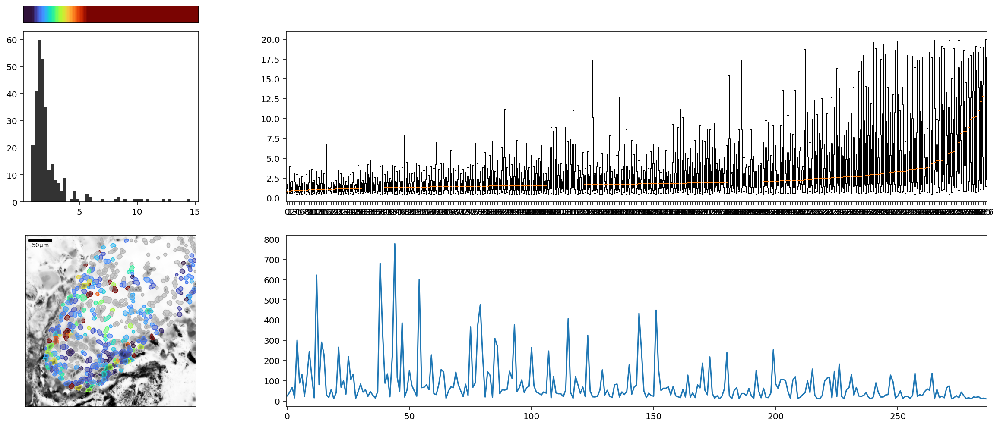

In [16]:
#### Details
mf.check_roi_heterogeneity(Events.query("halfwidth<20"),regions, boxplot_kwargs={"showfliers":False});

In [17]:
exps = list(allEpmpr["experiment"].unique())

In [18]:
jitter = .01 # how much you wish to stagger the points in the plot below
allEpmpr["plot_pos"] = allEpmpr[voi].apply(lambda xi: varList.index(xi)) + allEpmpr["experiment"].apply(lambda xi: exps.index(xi)-(len(exps)-1)/2)*jitter

Text(1, 1.03, '$\\tau_{1/2}<20$')

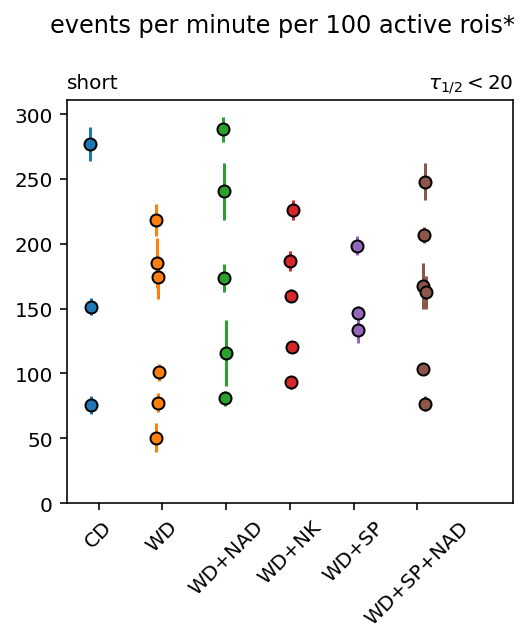

In [19]:
rescale = 100 # rescale to values you can change it if you wish
fig, axs = plt.subplots(1,len(hwRegions),figsize=(1+len(hwRegions)*len(varList)*.5,5))
plt.subplots_adjust(wspace=.5, top = .86, bottom = .3)

if rescale>1:
    fig.suptitle(f"events per minute per {rescale} active rois*")
else:
    fig.suptitle(f"events per minute per active roi*\n")
if len(hwRegions)==1:
    axs = [axs]
for ia,hwr in enumerate(hwRegions):
    ax = axs[ia]
    for exp,df in allEpmpr.query(f"hw_region=='{hwr}'").groupby("experiment"):
        ax.plot(df['plot_pos'],rescale*df['epmpr'], "grey")
    for var in varList:
        df = allEpmpr.query(f"hw_region=='{hwr}' and {voi}=='{var}'").copy()
        c = varColorCode[var]
        ax.errorbar(df['plot_pos'],
                    df["epmpr"]*rescale,
                    df["epmpr_std"]*rescale,
#                     color=c,
                    marker="o",ls="none", mec="k")
    ax.text(0,1.03,hwr, transform=ax.transAxes)
for ax in axs:
    ax.set_ylim(0,)
    ax.set_xlim(-.5,len(varList)+.5)
    ax.set_xticks(np.arange(len(varList)))
    ax.set_xticklabels([lbl.replace("_","+") for lbl in varList], rotation=45)
axs[0].text(1,1.03,r"$\tau_{1/2}<%g$"%hwRegions["short"][1],ha="right",transform=axs[0].transAxes)  

In [20]:
from tqdm.notebook import tqdm

In [21]:
# we again iterate over rows of data, this time collecting the important objects for each experiment:
allHWs = []
minEvents = 10

for i in tqdm(data.index):
    # ... import events, ...
    path = data.loc[i,"path"] 
    events_path = path.replace("_rois.pkl","_auto_events.csv")
    Events = pd.read_csv(events_path, index_col=0)
    # define legs
    legs = data.loc[i,"legs"]
    islets.EventDistillery.define_legs(Events, legs)
    Events = Events.dropna().copy()
    for hwr in hwRegions:
        hw0,hw1 = hwRegions[hwr]
        evs = Events.query(f"halfwidth<{hw1} and halfwidth>={hw0}")
        x = [dfr["halfwidth"].median() for roi,dfr in evs.groupby("roi") if len(dfr)>minEvents]
    
        tmp = {
            "experiment": "exp"+str(i),
            voi: data.loc[i,voi],
            "halfwidth": np.mean(x),
            "halfwidth sem": np.std(x)/np.sqrt(len(x)-1),
            "hw_region": hwr,
            }
    allHWs += [tmp]

  0%|          | 0/28 [00:00<?, ?it/s]

In [22]:
allHWs = pd.DataFrame(allHWs)

In [23]:
jitter = .01 # how much you wish to stagger the points in the plot below
allHWs["plot_pos"] = allHWs[voi].apply(lambda xi: varList.index(xi)) + allHWs["experiment"].apply(lambda xi: exps.index(xi)-(len(exps)-1)/2)*jitter

Text(1, 1.03, '$\\tau_{1/2}<20$')

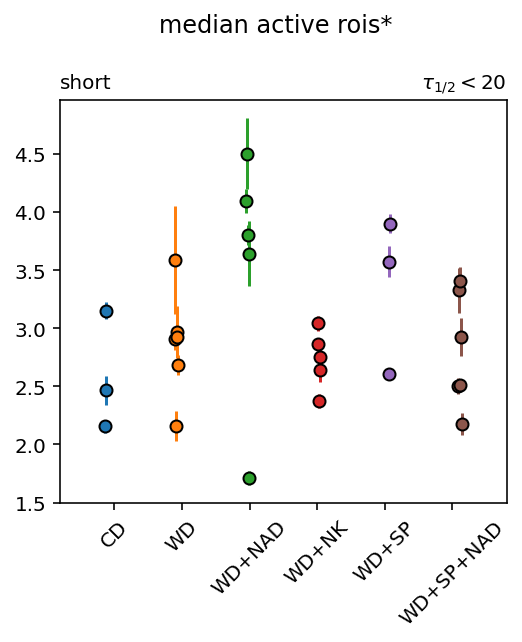

In [24]:
fig, axs = plt.subplots(1,len(hwRegions),figsize=(1+len(hwRegions)*len(varList)*.5,5))
plt.subplots_adjust(wspace=.5, top = .86, bottom = .3)


fig.suptitle(f"median halfwidth of active rois*")

if len(hwRegions)==1:
    axs = [axs]
for ia,hwr in enumerate(hwRegions):
    ax = axs[ia]
    for exp,df in allHWs.query(f"hw_region=='{hwr}'").groupby("experiment"):
        ax.plot(df['plot_pos'],df['halfwidth'], "grey")
    for var in varList:
        df = allHWs.query(f"hw_region=='{hwr}' and {voi}=='{var}'").copy()
        c = varColorCode[var]
        ax.errorbar(df['plot_pos'],
                    df["halfwidth"],
                    df["halfwidth sem"],
                    marker="o",ls="none", mec="k")
    ax.text(0,1.03,hwr, transform=ax.transAxes)
for ax in axs:
#     ax.set_ylim(0,)
    ax.set_xlim(-.8,len(varList)-.2)
    ax.set_xticks(np.arange(len(varList)))
    ax.set_xticklabels([lbl.replace("_","+") for lbl in varList], rotation=45)
axs[0].text(1,1.03,r"$\tau_{1/2}<%g$"%hwRegions["short"][1],ha="right",transform=axs[0].transAxes)  